In [57]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [58]:
%matplotlib inline

In [59]:
import numpy as np
import scipy.io as sio
import netCDF4 as nc
import glob, os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import matplotlib
import cmocean
matplotlib.rcParams['animation.embed_limit'] =10000000000000000000000000.0

In [60]:
%cd /work/eay/MITgcm_data/Experiment24

file0 = nc.Dataset('Temp.nc')
file1 = nc.Dataset('Salt.nc')
file2 = nc.Dataset('U.nc')
file3 = nc.Dataset('V.nc')
NX = 600
NY = 1000
NZ = 120

xq = (file1.variables['X'][:])
yq = (file1.variables['Y'][:])
zl = (file1.variables['Z'][:])
Time = file1.variables['T'][:]
print(Time.shape)

xqmat=np.tile(xq,(NY,1))
yqmat=np.tile(yq,(NX,1))
yqmat=np.transpose(yqmat)


grid = nc.Dataset('grid.nc')
depth = (grid.variables['Depth'][:])
print(depth.shape)

%cd /work/eay/MITgcm_data/

/work0/eay/MITgcm_data/Experiment24
(150,)
(1000, 600)
/work0/eay/MITgcm_data


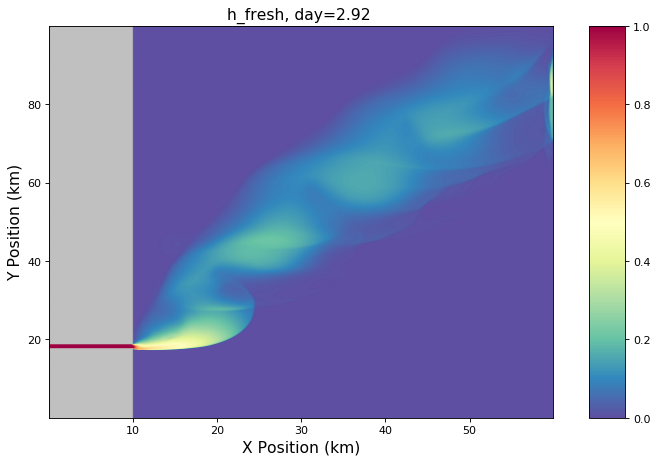

In [61]:
index = 149

Salt = file1.variables['S'][index,0,:,:]


#Plotting freshwater layer
mask = file1.variables['S'][30,0,:,:]
newmask = file1.variables['S'][30,:,:,:]
Salt_hf = file1.variables['S'][index,:,:,:]; Salt_hf[newmask==0]=np.nan
Sref = Salt_hf*0.0+34.0
hf=0.1*np.nansum((Sref-Salt_hf)/34.0,axis=0)
hf[(mask==0)]=-10000000
###hf(i,j)=0.1*sum((sr-s(i,j,:))/sr); (your delta z is 0.1 correct?)###

fig = plt.figure(figsize=(9, 7), dpi= 80, facecolor='w', edgecolor='k')
ax1 = fig.add_axes([0.15,0.1,0.7,0.7])  #left pos. bottom pos. width, height #ax1 = fig.add_subplot(111)
ax2 = fig.add_axes([.9, 0.1, 0.05, 0.7])


quad1 = ax1.pcolormesh(xq/1000,yq/1000,hf,cmap='Spectral_r',shading='gouraud',vmin=0,vmax=1)
quad1.cmap.set_under('silver')
#ax1.set_xlim(0,30)
ax1.set_title('h_fresh, day=%04.2f ' %(140/48.), fontsize=14)
ax1.set_facecolor((0.92, 0.92, 0.92))
ax1.set_xlabel('X Position (km)',fontsize=14)
ax1.set_ylabel('Y Position (km)',fontsize=14)
cb1 = fig.colorbar(quad1,ax2)

In [62]:
Salt.shape

(1000, 600)

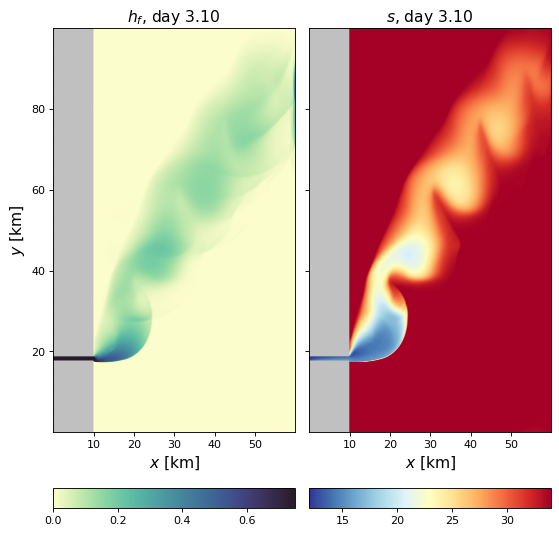

In [76]:

from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure(figsize=(8, 10), dpi= 80, facecolor='w', edgecolor='k')
#main plots
ax1 = fig.add_axes([0.15,0.2,0.4,0.6])  #left pos. bottom pos. width, height #ax1 = fig.add_subplot(111)
ax2 = fig.add_axes([0.55,0.2,0.4,0.6])  #left pos. bottom pos. width, height #ax1 = fig.add_subplot(111)
#legends
#ax3 = fig.add_axes([0.2, 0.1, 0.3, 0.03])
#ax4 = fig.add_axes([.6, 0.1, 0.3, 0.03])



quad1 = ax1.pcolormesh(xq/1000,yq/1000,hf,cmap=cmocean.cm.deep,shading='gouraud',vmin=0,vmax=.75)
quad1.cmap.set_under('silver')
##depth contours
#CS=ax1.contour(xq/1000, yq/1000, depth, [5.,10.,24.99],colors='k',alpha=0.8)
#manual_locations = [(8, 60), (12, 70), (38, 80)]
#ax1.clabel(CS, fontsize=12,fmt = '%1.0f',manual=manual_locations)
ax1.set_title('$h_f$, day %04.2f ' %(index/48.), fontsize=14)
ax1.set_facecolor((0.92, 0.92, 0.92))
ax1.set_xlabel('$x$ [km]',fontsize=14)
ax1.set_ylabel('$y$ [km]',fontsize=14)
ax1.set_aspect('equal')
divider1 = make_axes_locatable(ax1); cax1 = divider1.new_vertical(size="5%", pad=0.7, pack_start=True)
fig.add_axes(cax1); 
fig.colorbar(quad1, cax=cax1, orientation="horizontal")
#ax1.text(0.05, 0.9, '$b$',transform=ax3.transAxes,fontsize=25)

quad2 = ax2.pcolormesh(xq/1000,yq/1000,Salt,cmap='RdYlBu_r',vmin=12.,vmax=34.,shading='gouraud')
quad2.cmap.set_under('silver')
#ax3.set_xlim(0,30)
ax2.set_title('$s$, day %04.2f ' %(index/48.), fontsize=14)
ax2.set_facecolor((0.92, 0.92, 0.92))
ax2.set_xlabel('$x$ [km]',fontsize=14)
ax2.axes.set_yticklabels([''])
ax2.set_aspect('equal')
#cb1 = fig.colorbar(quad1,ax2,orientation="horizontal")
divider2 = make_axes_locatable(ax2); cax2 = divider2.new_vertical(size="5%", pad=0.7, pack_start=True)
fig.add_axes(cax2); fig.colorbar(quad2, cax=cax2, orientation="horizontal")
#ax3.text(0.05, 0.9, '$a$', transform=ax1.transAxes,fontsize=25)



In [77]:
def init():
    quad1.set_array([])
    quad2.set_array([])
    ax1.set_title([])
    ax2.set_title([])
    return quad1, quad2
def animate(iter):    
    #z = file1.variables['e'][iter,1:121,450,:]
    if 0 <= iter <= 149:
            Salt=file1.variables['S'][iter,0,:,:]
            Salt_hf=file1.variables['S'][iter,:,:,:]
            Salt_hf[newmask==0]=np.nan
            hf   = 0.1*np.nansum((Sref-Salt_hf)/34.0,axis=0)
            hf[(mask==0)]=-10000000
    quad1.set_array(hf.ravel())
    ax1.set_title('$h_f$, day=%04.2f ' %(iter/48.), fontsize=14)
    quad2.set_array(Salt.ravel())
    ax2.set_title('Salinity, day=%04.2f ' %(iter/48.), fontsize=14)
    return quad1, quad2
print('done')

done


In [80]:
mask.shape

(1000, 600)

In [81]:
anim = animation.FuncAnimation(fig,animate,frames=150,interval=100,blit=False,repeat=False)
print('done')

done


In [82]:
HTML(anim.to_jshtml())

In [83]:
anim.save('Video_hf_salt.gif', writer='imagemagick')
#cp Videotest.gif /home/eay/  for scp-ing from my local computer!
#scp public:/home/eay/Videotest.gif .
#matplotlib.rcParams['animation.embed_limit'] =40.0

In [84]:
print('done :)')

done :)
